## Imporrt Libraries 

In [1]:
import pandas as pd 
import plotly.express as px 
import seaborn as sns 
import matplotlib.pyplot as plt 
from sklearn.compose import ColumnTransformer 
from sklearn.preprocessing import StandardScaler , MinMaxScaler , OneHotEncoder
from category_encoders import BinaryEncoder
from sklearn.cluster import KMeans
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_validate
from sklearn.metrics import silhouette_score
from yellowbrick.cluster import KElbowVisualizer
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import FunctionTransformer
import numpy as np
import joblib

## Read Data

In [2]:
df1 = pd.read_csv ('Categories.csv')
df2 = pd.read_csv('Transactions.csv')

In [3]:
df1.head()

,MerchantName,Category
0,Grill Emperor,F&B
1,Threads Royale,fashion
2,Cakeland,F&B
3,Quick Stop,Grocery
4,Marketplace Central,Grocery


In [4]:
df2.head()

,CustomerID,MerchantName,TransactionRank,TransactionRedeemedPoints,TransactionValue,TransactionFrom(days),CustomerLastTransactionFrom(days)
0,1,Grill Emperor,1,4427,442.7,281,281
1,2,Threads Royale,1,2490,249.0,34,34
2,3,Cakeland,1,3000,300.0,236,236
3,4,Threads Royale,1,1620,162.0,320,320
4,5,Quick Stop,1,700,70.0,407,407


## Merge data

In [5]:
df = pd.merge(df1, df2, on='MerchantName')

## Describe Data

In [6]:
df.head()

,MerchantName,Category,CustomerID,TransactionRank,TransactionRedeemedPoints,TransactionValue,TransactionFrom(days),CustomerLastTransactionFrom(days)
0,Grill Emperor,F&B,1,1,4427,442.7,281,281
1,Grill Emperor,F&B,19,1,3540,354.0,272,102
2,Grill Emperor,F&B,34,1,1760,176.0,421,421
3,Grill Emperor,F&B,66,1,740,74.0,6,6
4,Grill Emperor,F&B,67,1,1500,150.0,291,291


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43929 entries, 0 to 43928
Data columns (total 8 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   MerchantName                       43929 non-null  object 
 1   Category                           43929 non-null  object 
 2   CustomerID                         43929 non-null  int64  
 3   TransactionRank                    43929 non-null  int64  
 4   TransactionRedeemedPoints          43929 non-null  int64  
 5   TransactionValue                   43929 non-null  float64
 6   TransactionFrom(days)              43929 non-null  int64  
 7   CustomerLastTransactionFrom(days)  43929 non-null  int64  
dtypes: float64(1), int64(5), object(2)
memory usage: 2.7+ MB


In [8]:
df.describe()

,CustomerID,TransactionRank,TransactionRedeemedPoints,TransactionValue,TransactionFrom(days),CustomerLastTransactionFrom(days)
count,43929.000000,43929.000000,43929.00000,43929.000000,43929.000000,43929.000000
mean,17162.764552,1.269207,3352.54513,335.254513,185.201211,143.870313
std,9660.268835,0.784751,5916.63287,591.663287,122.209782,114.985727
min,1.000000,1.000000,0.00000,0.000000,1.000000,1.000000
25%,8699.000000,1.000000,1220.00000,122.000000,62.000000,34.000000
50%,17531.000000,1.000000,1890.00000,189.000000,203.000000,115.000000
75%,25630.000000,1.000000,3118.00000,311.800000,271.000000,252.000000
max,33521.000000,17.000000,263800.00000,26380.000000,698.000000,682.000000


In [9]:
df.describe(include='O')

,MerchantName,Category
count,43929,43929
unique,59,13
top,Marketplace Central,Grocery
freq,19389,26483


## Data cleaning & visualization 

#### MerchantName

In [10]:
df['MerchantName'].unique()

array(['Grill Emperor', 'Threads Royale', 'Cakeland', 'Quick Stop',
       'Marketplace Central', 'Family Grocers', 'Aroma Beans',
       'Zest Market', 'Herbal Wellness', 'ClearSight Optics',
       'Nuts & Seeds Co.', 'Smokehouse Grill', 'Peppers Diner',
       'Zanobia Textiles', 'City Squad Fashions', 'Global Media Hub',
       'Gizmo Genius', 'TouchTech Innovations', 'Sweets & Fizz',
       'Urban Rides', 'Mamma Mia', 'FryBird', 'Retro Rewind', 'Playland',
       'Lola Market', 'Lucky Finds', 'Morad Crafts', 'Date Palm Delights',
       'Cinema Egypt', 'TickTock Time', 'Rainbow Electronics',
       'Grandpa’s Kitchen', 'Guard Vogue', 'Canal Mart',
       'Tabouleh Tavern', 'Pie Corner', 'Bubble Joy', 'Diamond Dreams',
       'Gemstone Gallery', 'Oscar’s Bazaar', 'Nassif Jewels',
       'Breeze Spaces', 'Federation Retail', 'TechWave', 'SoundSphere',
       'Vision Vogue', 'Tie Territory', 'Gahar Goods', 'FishNet Seafoods',
       'Gabby’s Grill', 'Vincent’s Pizza', 'TravelTrend Lu

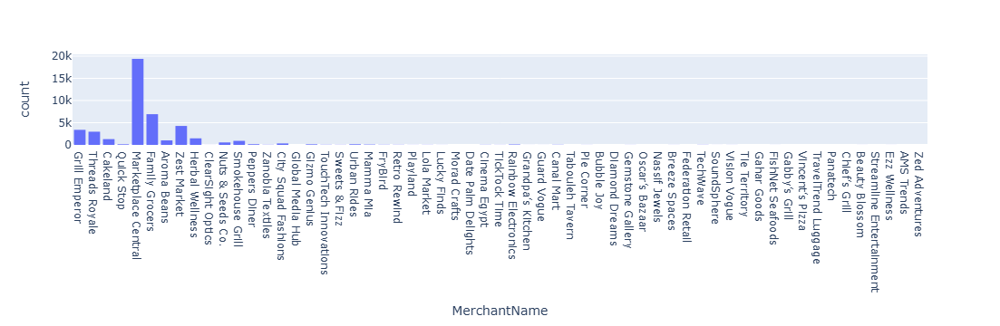

In [11]:
px.histogram(df , 'MerchantName')

#### Category

In [12]:
df['Category'].unique()

array(['F&B', 'fashion', 'Grocery', 'Groceri', 'Health & Beauty',
       'Fashion', 'F_B', 'Electronics', 'Transportaion', 'Entertainment',
       'Car Services', 'Jewerlies', 'Optics'], dtype=object)

In [13]:
def cateogry_cleaning (x) :
    if x == 'F_B' :
        return 'F&B'
    elif  x == 'fashion' :
        return 'Fashion'
    elif  x == 'Groceri' :
        return 'Grocery'
    else : 
        return x 
df['Category'] = df['Category'].apply(cateogry_cleaning)

In [14]:
df['Category'].unique()

array(['F&B', 'Fashion', 'Grocery', 'Health & Beauty', 'Electronics',
       'Transportaion', 'Entertainment', 'Car Services', 'Jewerlies',
       'Optics'], dtype=object)

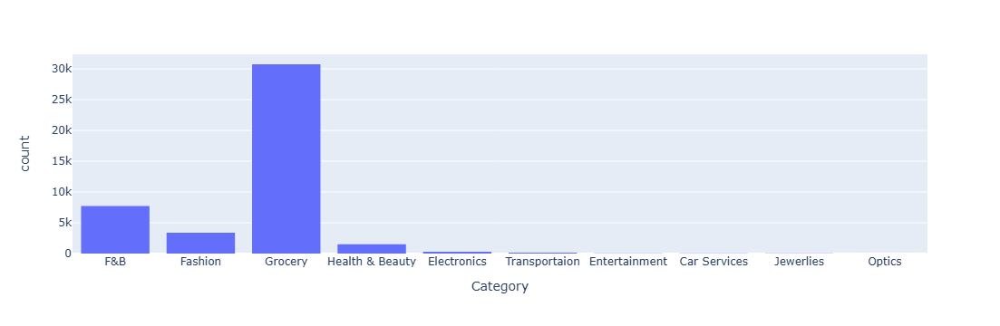

In [15]:
px.histogram(df , 'Category')

#### TransactionRank

In [16]:
df['TransactionRank'].unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17],
      dtype=int64)

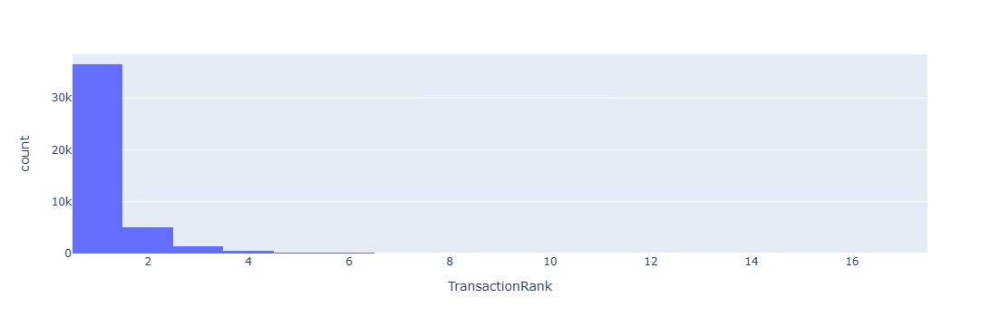

In [17]:
px.histogram(df , 'TransactionRank')

#### TransactionRedeemedPoints

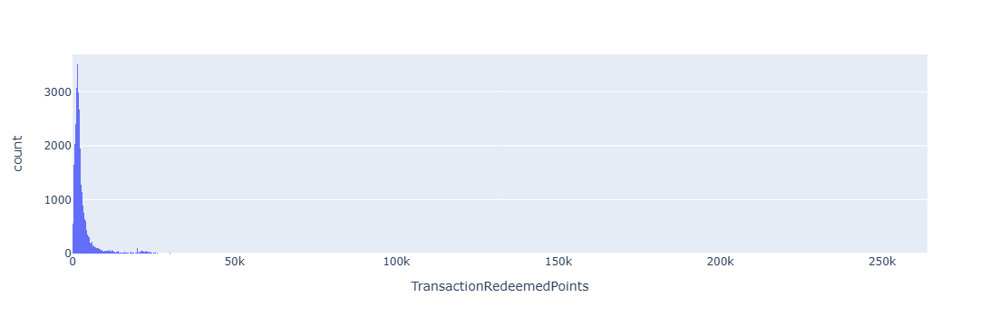

In [18]:
px.histogram(df , 'TransactionRedeemedPoints')

#### TransactionValue

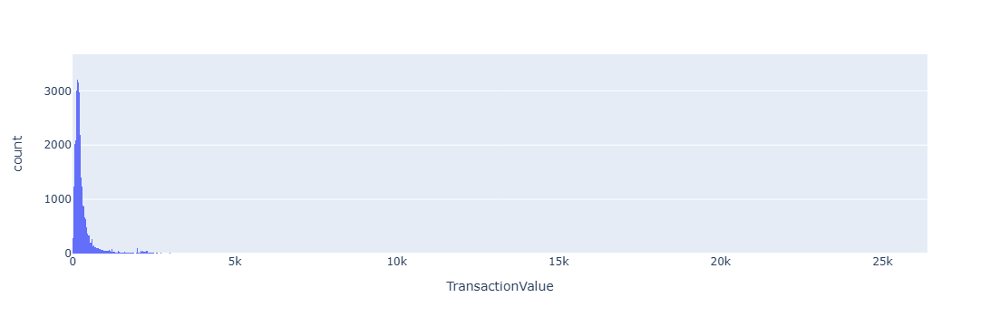

In [19]:
px.histogram(df , 'TransactionValue')

#### TransactionFrom(days) 

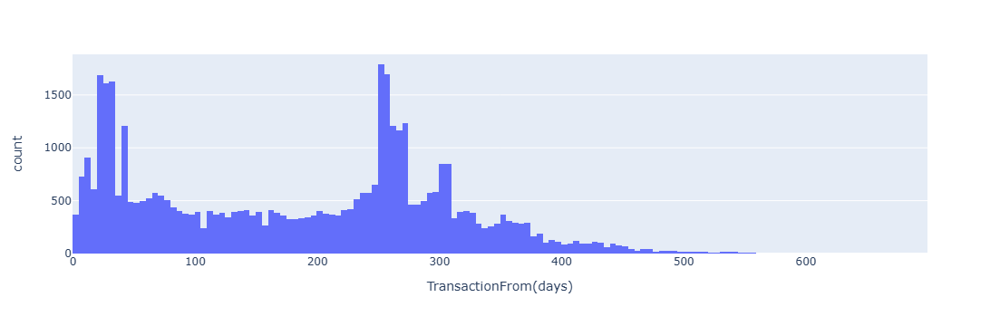

In [20]:
px.histogram(df , 'TransactionFrom(days)')

#### CustomerLastTransactionFrom(days)

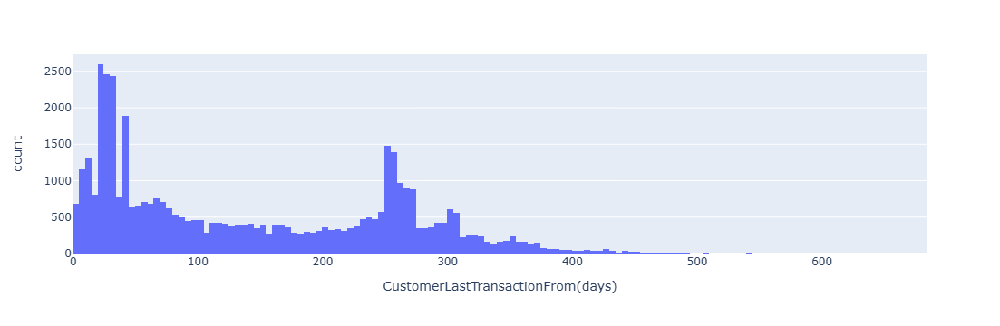

In [21]:
px.histogram(df , 'CustomerLastTransactionFrom(days)')

In [22]:
df['result'] = df['TransactionRedeemedPoints'] / df ['TransactionValue']

In [23]:
df[df['result']!= 10]

,MerchantName,Category,CustomerID,TransactionRank,TransactionRedeemedPoints,TransactionValue,TransactionFrom(days),CustomerLastTransactionFrom(days),result
5615,Threads Royale,Fashion,25002,1,0,0.0,366,27,NaN
5617,Threads Royale,Fashion,25002,3,0,0.0,296,27,NaN
7781,Quick Stop,Grocery,25002,1,0,0.0,357,27,NaN
11967,Marketplace Central,Grocery,7230,1,0,0.0,352,351,NaN
11968,Marketplace Central,Grocery,7230,2,0,0.0,351,351,NaN
11969,Marketplace Central,Grocery,7230,3,0,0.0,351,351,NaN
12708,Marketplace Central,Grocery,8497,4,0,0.0,347,179,NaN
12709,Marketplace Central,Grocery,8497,5,0,0.0,288,179,NaN
22438,Marketplace Central,Grocery,25002,1,0,0.0,354,27,NaN
22439,Marketplace Central,Grocery,25002,2,0,0.0,353,27,NaN


In [24]:
df = df[df['TransactionRedeemedPoints']!= 0]

In [25]:
## drop TransactionValue cause contain the same info of TransactionRedeemedPoints
df.drop(columns=['result' , 'TransactionValue'] , inplace= True)

In [26]:
df.corr(numeric_only= True)

,CustomerID,TransactionRank,TransactionRedeemedPoints,TransactionFrom(days),CustomerLastTransactionFrom(days)
CustomerID,1.000000,0.032148,0.016409,0.109410,0.058621
TransactionRank,0.032148,1.000000,0.070441,-0.134738,-0.185810
TransactionRedeemedPoints,0.016409,0.070441,1.000000,0.039060,0.015048
TransactionFrom(days),0.109410,-0.134738,0.039060,1.000000,0.696145
CustomerLastTransactionFrom(days),0.058621,-0.185810,0.015048,0.696145,1.000000


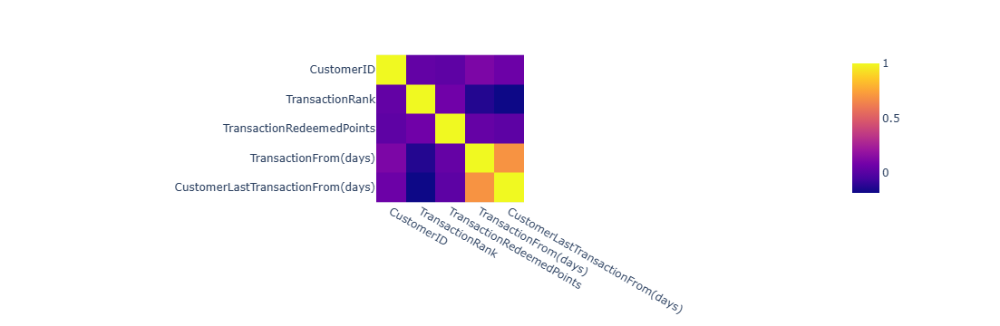

In [27]:
px.imshow(df.corr(numeric_only= True))

In [28]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 43901 entries, 0 to 43928
Data columns (total 7 columns):
 #   Column                             Non-Null Count  Dtype 
---  ------                             --------------  ----- 
 0   MerchantName                       43901 non-null  object
 1   Category                           43901 non-null  object
 2   CustomerID                         43901 non-null  int64 
 3   TransactionRank                    43901 non-null  int64 
 4   TransactionRedeemedPoints          43901 non-null  int64 
 5   TransactionFrom(days)              43901 non-null  int64 
 6   CustomerLastTransactionFrom(days)  43901 non-null  int64 
dtypes: int64(5), object(2)
memory usage: 2.7+ MB


### Analysis

#### Most categories where people redeem there points 

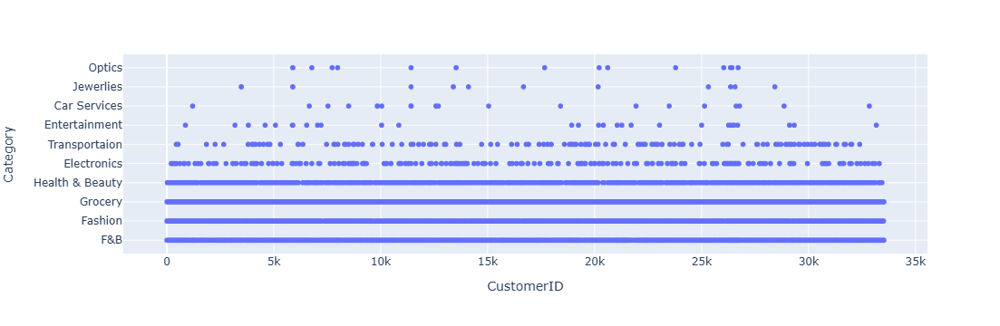

In [29]:
px.scatter(df , x = 'CustomerID' , y = 'Category'  )

In [30]:
## most people redeem points in (F&B , Fashion , Grocery , Health & Beauty)

In [31]:
frequency = df.groupby(['CustomerID', 'MerchantName'])['TransactionRank'].max().reset_index()

# Step 2: Rename the sum column to 'Monetary'
frequency.rename(columns={'TransactionRank': 'Frequency'}, inplace=True)

# Step 3: Merge the monetary DataFrame back into the original DataFrame
df = df.merge(frequency, on=['CustomerID', 'MerchantName'])


In [32]:
Monetary = df.groupby(['CustomerID', 'MerchantName'])['TransactionRedeemedPoints'].sum().reset_index()

# Step 2: Rename the sum column to 'Monetary'
Monetary.rename(columns={'TransactionRedeemedPoints': 'Monetary'}, inplace=True)

# Step 3: Merge the monetary DataFrame back into the original DataFrame
df = df.merge(Monetary, on=['CustomerID', 'MerchantName'])


In [33]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43901 entries, 0 to 43900
Data columns (total 9 columns):
 #   Column                             Non-Null Count  Dtype 
---  ------                             --------------  ----- 
 0   MerchantName                       43901 non-null  object
 1   Category                           43901 non-null  object
 2   CustomerID                         43901 non-null  int64 
 3   TransactionRank                    43901 non-null  int64 
 4   TransactionRedeemedPoints          43901 non-null  int64 
 5   TransactionFrom(days)              43901 non-null  int64 
 6   CustomerLastTransactionFrom(days)  43901 non-null  int64 
 7   Frequency                          43901 non-null  int64 
 8   Monetary                           43901 non-null  int64 
dtypes: int64(7), object(2)
memory usage: 3.0+ MB


In [34]:
df[df['TransactionRank']>10]

,MerchantName,Category,CustomerID,TransactionRank,TransactionRedeemedPoints,TransactionFrom(days),CustomerLastTransactionFrom(days),Frequency,Monetary
108,Grill Emperor,F&B,1239,11,3440,120,9,11,82408
2439,Grill Emperor,F&B,25630,11,900,270,259,11,24261
9796,Marketplace Central,Grocery,3479,11,23960,32,12,12,629700
9797,Marketplace Central,Grocery,3479,12,34000,12,12,12,629700
9892,Marketplace Central,Grocery,3633,11,2880,5,5,11,34980
24671,Marketplace Central,Grocery,29006,11,260,64,34,12,3670
24672,Marketplace Central,Grocery,29006,12,250,34,34,12,3670
26122,Marketplace Central,Grocery,31662,11,290,27,2,12,3610
26123,Marketplace Central,Grocery,31662,12,360,2,2,12,3610
35464,Zest Market,Grocery,4361,11,7320,110,27,13,187372


In [35]:
Recency = df.groupby(['CustomerID', 'MerchantName'])['TransactionFrom(days)'].min().reset_index()


Recency.rename(columns={'TransactionFrom(days)': 'Recency'}, inplace=True)


df = df.merge(Recency, on=['CustomerID', 'MerchantName'])


In [36]:
df.head()

,MerchantName,Category,CustomerID,TransactionRank,TransactionRedeemedPoints,TransactionFrom(days),CustomerLastTransactionFrom(days),Frequency,Monetary,Recency
0,Grill Emperor,F&B,1,1,4427,281,281,1,4427,281
1,Grill Emperor,F&B,19,1,3540,272,102,1,3540,272
2,Grill Emperor,F&B,34,1,1760,421,421,1,1760,421
3,Grill Emperor,F&B,66,1,740,6,6,1,740,6
4,Grill Emperor,F&B,67,1,1500,291,291,1,1500,291


In [37]:
df[(df['TransactionFrom(days)']!= df['CustomerLastTransactionFrom(days)'])&( df['Frequency'] !=1)]

,MerchantName,Category,CustomerID,TransactionRank,TransactionRedeemedPoints,TransactionFrom(days),CustomerLastTransactionFrom(days),Frequency,Monetary,Recency
13,Grill Emperor,F&B,221,1,2360,175,164,2,5800,164
15,Grill Emperor,F&B,227,1,1240,455,301,2,1910,301
30,Grill Emperor,F&B,350,1,3000,260,130,2,4340,130
41,Grill Emperor,F&B,530,1,5450,354,88,4,16099,88
42,Grill Emperor,F&B,530,2,123,318,88,4,16099,88
...,...,...,...,...,...,...,...,...,...,...
43882,Beauty Blossom,Health & Beauty,31333,1,9100,307,305,2,11600,307
43883,Beauty Blossom,Health & Beauty,31333,2,2500,307,305,2,11600,307
43888,Ezz Wellness,Health & Beauty,22845,1,1200,388,72,2,2500,369
43889,Ezz Wellness,Health & Beauty,22845,2,1300,369,72,2,2500,369


In [38]:
# Perform groupby and aggregation
df_grouped = df.groupby(['CustomerID', 'Category']).agg({'Frequency': 'max'}).reset_index()

# Now you have a DataFrame with 'CustomerID', 'Category', and 'Frequency' columns.
# Merge the result back to the original DataFrame
df = df.merge(df_grouped, on=['CustomerID', 'Category'], suffixes=('', '_max'))


In [39]:
df_max_freq = df.loc[df.groupby('CustomerID')['Frequency_max'].idxmax()]
df = df_max_freq.reset_index(drop=True)


In [40]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33520 entries, 0 to 33519
Data columns (total 11 columns):
 #   Column                             Non-Null Count  Dtype 
---  ------                             --------------  ----- 
 0   MerchantName                       33520 non-null  object
 1   Category                           33520 non-null  object
 2   CustomerID                         33520 non-null  int64 
 3   TransactionRank                    33520 non-null  int64 
 4   TransactionRedeemedPoints          33520 non-null  int64 
 5   TransactionFrom(days)              33520 non-null  int64 
 6   CustomerLastTransactionFrom(days)  33520 non-null  int64 
 7   Frequency                          33520 non-null  int64 
 8   Monetary                           33520 non-null  int64 
 9   Recency                            33520 non-null  int64 
 10  Frequency_max                      33520 non-null  int64 
dtypes: int64(9), object(2)
memory usage: 2.8+ MB


In [41]:
df.drop(columns=['TransactionRank' , 'TransactionRedeemedPoints' , 'TransactionFrom(days)' , 'CustomerLastTransactionFrom(days)' , 'Frequency_max' ] , inplace= True)
df = df.drop_duplicates()
df = df.sample(frac=1).reset_index(drop=True)

In [42]:
Encoder = ColumnTransformer(transformers=[("OH", OneHotEncoder(sparse_output=False, drop="first"), ['MerchantName', 'Category'])],remainder="passthrough")

In [55]:
df2 = df.copy()
df_shuffled = df.sample(frac=1, random_state=42).reset_index(drop=True)
steps = []
steps.append (("Encoder" , Encoder ))
steps.append (("Scaler" , StandardScaler()))
steps.append (("Model" , KMeans(n_init = 20  ,max_iter = 1000  )))
pipeline = Pipeline(steps=steps)
transformed_df = pipeline.fit_transform(df)
cluster_labels = pipeline.named_steps['Model'].labels_
df2['Cluster_kmeans'] = cluster_labels
kmeans_model = pipeline.named_steps['Model']
clusters = kmeans_model.n_clusters
inertia = kmeans_model.inertia_
sil_score = silhouette_score(transformed_df, df2['Cluster_kmeans'])
print(f'no of clusters :{clusters} ---- inertia : {inertia} ---- Silhouette Score: {sil_score}')


no of clusters :8 ---- inertia : 1713133.5544228496 ---- Silhouette Score: 0.5918428877369343


<bound method Visualizer.show of KElbowVisualizer(ax=<Axes: >,
                 estimator=KMeans(max_iter=1000, n_clusters=19, n_init=20),
                 k=(2, 20))>

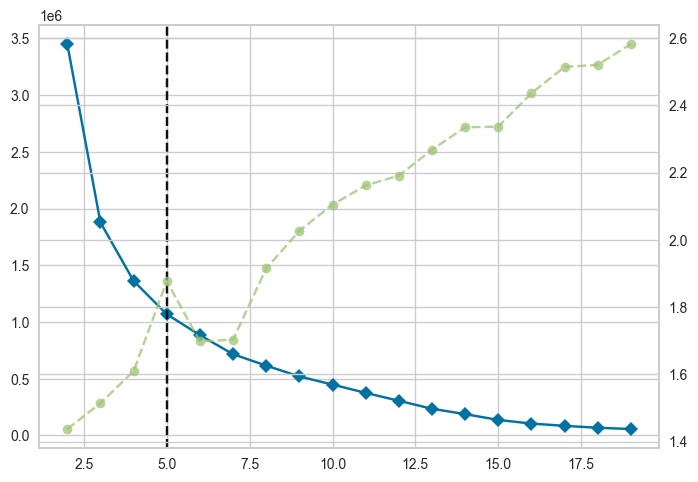

In [60]:
visualizer = KElbowVisualizer(kmeans_model , k = (2 , 20))
visualizer.fit(transformed_df)
visualizer.show

In [74]:
df = df.sample(frac=1, random_state=42).reset_index(drop=True)
steps = []
steps.append (("Encoder" , Encoder ))
steps.append (("Scaler" , StandardScaler()))
steps.append (("Model" , KMeans( n_clusters=   , n_init = 20 , max_iter= 1000 )))
pipeline = Pipeline(steps=steps)
transformed_df = pipeline.fit_transform(df)
cluster_labels = pipeline.named_steps['Model'].labels_
df2['Cluster_kmeans'] = cluster_labels
kmeans_model = pipeline.named_steps['Model']
clusters = kmeans_model.n_clusters
inertia = kmeans_model.inertia_
sil_score = silhouette_score(transformed_df, df2['Cluster_kmeans'])
print(f'no of clusters :{clusters} ---- inertia : {inertia} ---- Silhouette Score: {sil_score}')


no of clusters :7 ---- inertia : 1760829.3284740113 ---- Silhouette Score: 0.6084375015952196


#### Hierarchical clustering

Silhouette Score: 0.4308826632922805


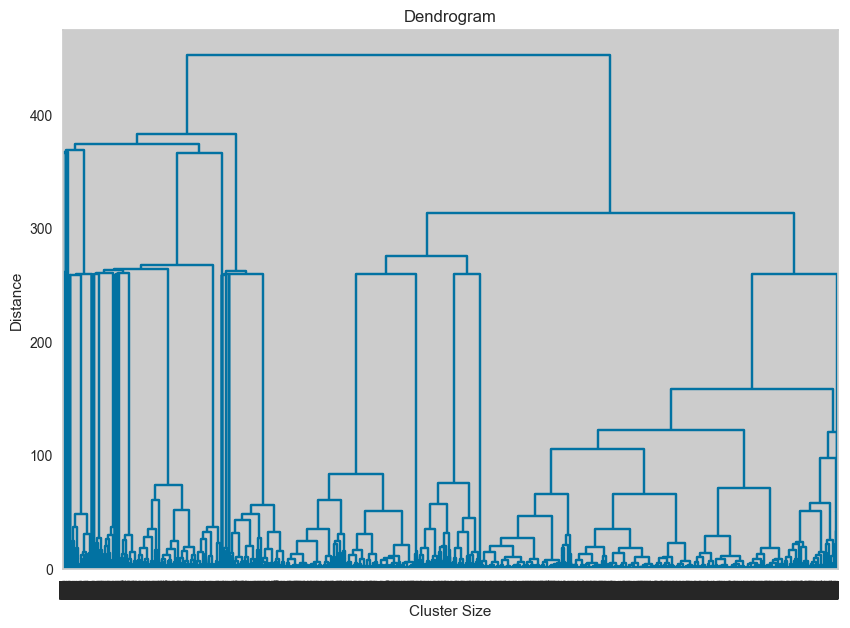

In [46]:
steps = []
steps.append(("Encoder", Encoder))
steps.append(("Scaler", StandardScaler()))
steps.append(("Model", AgglomerativeClustering(n_clusters=5)))
pipeline = Pipeline(steps=steps)


df2['Cluster_AGG'] = pipeline.fit_predict(df)


transformed_data = pipeline.named_steps['Scaler'].transform(pipeline.named_steps['Encoder'].transform(df))


sil_score = silhouette_score(transformed_data, df2['Cluster_AGG'])

print("Silhouette Score:", sil_score)

linked = linkage(transformed_data, method='ward') 
plt.figure(figsize=(10, 7))
dendrogram(linked,
           orientation='top',
           distance_sort='descending',
           show_leaf_counts=True,
           color_threshold=0)  
plt.title('Dendrogram')
plt.xlabel('Cluster Size')
plt.ylabel('Distance')
plt.show()


## DBSCAN

In [ ]:
def apply_dbscan(X):
    dbscan_model = DBSCAN( eps=10   )
    cluster_labels = dbscan_model.fit_predict(X)
    return np.expand_dims(cluster_labels, axis=1) 

steps = [
    ("Encoder", Encoder),  
    ("Scaler", StandardScaler()),  
    ("DBSCAN", FunctionTransformer(apply_dbscan, validate=False))  
]


pipeline = Pipeline(steps=steps)


transformed_df= pipeline.fit_transform(df)
df2['Cluster_DBSCAN'] = cluster_labels





no_of_clusters = len(set(cluster_labels)) - (1 if -1 in cluster_labels else 0)

# Silhouette score calculation (if there are more than 1 clusters)
if no_of_clusters > 1:
    sil_score = silhouette_score(transformed_df, cluster_labels)
    print(f'No. of clusters: {no_of_clusters} ---- Silhouette Score: {sil_score}')
else:
    print(f'No. of clusters: {no_of_clusters} ---- Silhouette Score: Not applicable (need at least 2 clusters)')


In [75]:
df['Cluster'] = df2['Cluster_kmeans']

In [76]:
grouped = df.groupby(['Cluster', 'MerchantName']).size().reset_index(name='count')
top_merchants = grouped.groupby('Cluster').apply(lambda x: x.nlargest(3, 'count')).reset_index(drop=True)



C:\Users\dell\AppData\Local\Temp\ipykernel_9092\3941519656.py:2: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [80]:
merchant_recommendations = top_merchants.groupby('Cluster')['MerchantName'].apply(list).reset_index()
merchant_recommendations.columns = ['Cluster', 'Recommended Merchants']

# Step 4: Merge the recommendations back to the original DataFrame
df = df.merge(merchant_recommendations, on='Cluster', how='left')


In [81]:
df.head()

,MerchantName,Category,CustomerID,Frequency,Monetary,Recency,Cluster,Recommended Merchants
0,Marketplace Central,Grocery,240,1,2125,27,4,"[Marketplace Central, Family Grocers, Zest Mar..."
1,Grill Emperor,F&B,1438,2,2800,8,0,"[Grill Emperor, Cakeland, Aroma Beans]"
2,Marketplace Central,Grocery,24609,1,2880,65,4,"[Marketplace Central, Family Grocers, Zest Mar..."
3,Marketplace Central,Grocery,28826,2,23980,265,4,"[Marketplace Central, Family Grocers, Zest Mar..."
4,Zest Market,Grocery,19585,1,2055,245,4,"[Marketplace Central, Family Grocers, Zest Mar..."


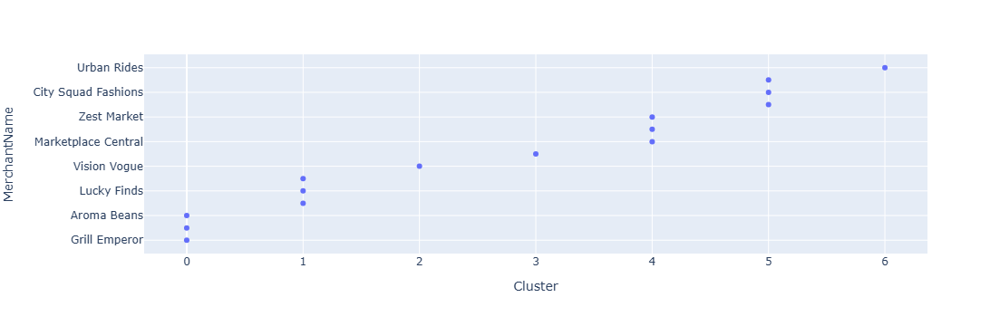

In [77]:
px.scatter(top_merchants , x = 'Cluster' , y = 'MerchantName')

In [97]:
joblib.dump (df.columns , 'inputs.pkl' )
df.to_csv('data.csv')

In [149]:
%%writefile app_customer_segmentation.py

import streamlit as st
import pandas as pd 
import joblib

inputs = joblib.load('inputs.pkl')
data = pd.read_csv('data.csv') 

def get_recommended_merchants(customer_id):
    
    customer_info = data[data['CustomerID'] == customer_id]
    
    if not customer_info.empty:
        
        recommended_merchants = customer_info['Recommended Merchants'].values[0]
        return recommended_merchants
    else:
        return None

def main(): 
    st.title("Customer Segmentation App")
    
   
    customer_id = st.sidebar.text_input("Enter Customer ID:")
    
    if st.sidebar.button("Get Recommended Merchants"):
        if customer_id:
            
            try:
                customer_id = int(customer_id)
                recommended_merchants = get_recommended_merchants(customer_id)

                if recommended_merchants is not None:
                    # Create a DataFrame to display the result
                   
                   result = f"CustomerID: {customer_id}\n\nRecommended Merchants\n\n{recommended_merchants} " 


                   st.write(result)
                else:
                    st.write("Customer ID not found. Please check your input.")
            except ValueError:
                st.write("Please enter a valid Customer ID (numeric).")
        else:
            st.write("Please enter a Customer ID to see the recommendations.")

if __name__ == "__main__":
    main()


Overwriting app_customer_segmentation.py


In [148]:
!streamlit run app_customer_segmentation.py

^C


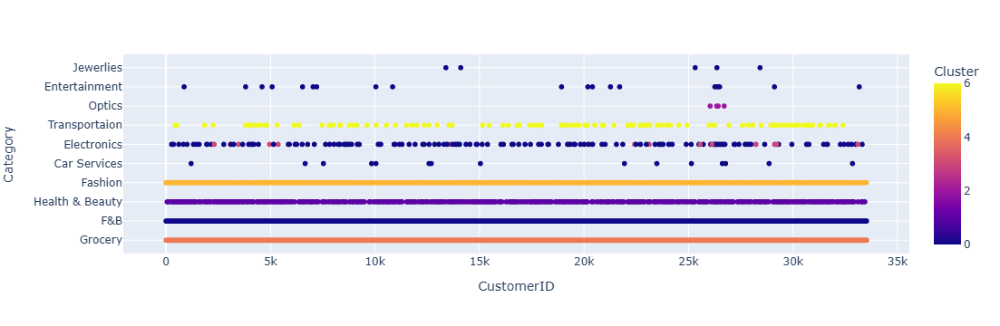

In [78]:
px.scatter(df , 'CustomerID' , 'Category' , color= 'Cluster')

In [82]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 33520 entries, 0 to 33519
Data columns (total 8 columns):
 #   Column                 Non-Null Count  Dtype 
---  ------                 --------------  ----- 
 0   MerchantName           33520 non-null  object
 1   Category               33520 non-null  object
 2   CustomerID             33520 non-null  int64 
 3   Frequency              33520 non-null  int64 
 4   Monetary               33520 non-null  int64 
 5   Recency                33520 non-null  int64 
 6   Cluster                33520 non-null  int32 
 7   Recommended Merchants  33520 non-null  object
dtypes: int32(1), int64(4), object(3)
memory usage: 1.9+ MB
